Written by https://github.com/quantaosun in `python`, ideal for Google Colab with GPU

## A consise Protein-ligand Moelcular Dynamic Simulation Workflow

* Core MD Engine  
  - `openmm` (GPU-accelerated MD)  
  - `openmmforcefields` (Force field handling)  
  - `pdbfixer` (Structure preparation)  
  - `PyMOL` (Structure preparation/visualization/Analysis)  

* Parameterization for small molecules  
  - `openff-toolkit` (SMIRNOFF force fields)  

* Environment  
  - `colabconda` (Package management in Colab)  

* NOT USED
 * `Ambertools` (Alternative to OpenFF pipeline)  
 * `rdkit` (Chemical informatics - replaced by OpenFF)  





In [ ]:
#######################################################################

Inputs:



*   The user has used pymol to fetch the structure and saved the complex such as `3htb.pdb`
*   The user has extract and saved the ligand as a separate file in pdb format, for example `lig.pdb`











In [ ]:
#@title Install condacolab
!pip install condacolab
import condacolab
condacolab.install()

In [ ]:
#######################################################################

 Wait for several seconds before clicking on the next cell.

In [1]:
#@title Denpendencies installation
#Pdbfixer requires openmm 8.2 or above, so double check the openmm version you just installed. This version issue could be a problem over time, even if it is ok for now.
!conda install -c conda-forge openmm -y > /dev/null 2>&1
# used for protein structure initial processing
!conda install -c conda-forge pdbfixer -y > /dev/null 2>&1
#Install openmmforcefield for small molecule parameterisation
!conda install -c conda-forge openmmforcefields -y > /dev/null 2>&1
# This is used to read/relay input to openmmforcefileds object
!conda install conda-forge::openff-toolkit -y > /dev/null 2>&1
# this and rdkit, either is good, but this one is a more mordern way to read molecules.
!conda install conda-forge::py3dmol -y > /dev/null 2>&1
# for solvated structure visualisation
!conda install conda-forge::nglview -y > /dev/null 2>&1
!conda install conda-forge::mdtraj -y /dev/null 2>&1
# the last two for analysis after production

In [ ]:
#######################################################################

In [2]:
#@title Please, provide the PyMol saved protein-ligand PDB file path
# 1. Fix protein WITHOUT removing heterogens (keep ligand)
from pdbfixer import PDBFixer
from openmm.app import PDBFile
pymol_processed_pdb ="/content/6i5i.pdb" #@param {type:"string"}
fixer = PDBFixer(pymol_processed_pdb)
fixer.findMissingResidues()
fixer.findNonstandardResidues()
fixer.replaceNonstandardResidues()
fixer.findMissingAtoms()
fixer.addMissingAtoms()
fixer.addMissingHydrogens(7.0)  # pH 7.0

# 2. Write cleaned complex (protein + ligand)
PDBFile.writeFile(fixer.topology, fixer.positions, open('complex_fixed.pdb', 'w'))

In [3]:
#@title Please provide the carnonical smiles for ligand parameterisation
from openmm.app import PDBFile, Modeller, ForceField
from openmmforcefields.generators import SMIRNOFFTemplateGenerator
from openmm import unit as openmm_unit  # OpenMM's unit system
from openff.units import unit as openff_unit  # OpenFF's unit system
from openff.toolkit.topology import Molecule

# 1. Load the pre-combined complex
complex_pdb = PDBFile("complex_fixed.pdb")  # Contains both protein and JZ4

# 2. Parameterize ligand from SMILES (no RDKit PDB needed)
ligand_smiles = "Cn1cc(cn1)c2ccc3occ(c4cnn(Cc5ccccc5)c4)c3n2"  #@param {type:"string"}

ligand_off = Molecule.from_smiles(ligand_smiles, allow_undefined_stereo=True)

# 3. Set up force field
smirnoff = SMIRNOFFTemplateGenerator(
    molecules=ligand_off,
    forcefield="openff-2.0.0"
)
forcefield = ForceField("amber14-all.xml", "tip3p.xml")
forcefield.registerTemplateGenerator(smirnoff.generator)


In [ ]:
#######################################################################

In [ ]:
#@title Solvation Setup (Runs After Parameterization)
from openmm.app import PDBFile, Modeller, ForceField
from openmm.app import PDBFile, Modeller, ForceField, PME, HBonds


# 1. Create Modeller using EXISTING variables
modeller = Modeller(complex_pdb.topology, complex_pdb.positions)

# 2. Add solvent (customizable via widgets)
solvent_padding = 1.0  #@param {type:"slider", min:0.8, max:1.5, step:0.1}
add_ions = False  #@param {type:"boolean"}

modeller.addSolvent(
    forcefield=forcefield,  # Uses your existing forcefield
    padding=solvent_padding*openmm_unit.nanometers,  # Consistent units
    ionicStrength=0.15*openmm_unit.molar if add_ions else 0*openmm_unit.molar,
    neutralize=add_ions
)

# 3. Create solvated system (using existing forcefield)
solvated_system = forcefield.createSystem(
    modeller.topology,
    nonbondedMethod=PME,
    nonbondedCutoff=1.0*openmm_unit.nanometers,
    constraints=HBonds
)

# 4. Save outputs (consistent naming)
solvated_pdb = "solvated_complex.pdb"
with open(solvated_pdb, "w") as f:
    PDBFile.writeFile(modeller.topology, modeller.positions, f)

print(f"""
✅ Solvation complete using existing parameters:
- Forcefield: {forcefield._templates.keys()}
- Ligand SMILES: {ligand_smiles}
- Water molecules: {sum(1 for r in modeller.topology.residues() if r.name == 'HOH')}
""")

In [11]:
#@title Visualization
import py3Dmol
view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js')
view.addModel(open(solvated_pdb).read(), 'pdb')
view.setStyle({'resn':'HOH'}, {'sphere':{'radius':0.3}})
view.setStyle({'not': {'resn':'HOH'}}, {'stick':{}})
view.zoomTo()
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
#@title PBC Verification (Run After Solvation)
from openmm import Vec3

# 1. Check if PBC vectors exist in the topology
pbc_vectors = modeller.topology.getPeriodicBoxVectors()
if pbc_vectors is None:
    print("❌ No PBC detected - solvation failed to add box vectors")
else:
    print(f"✅ PBC Active - Box Dimensions (Å):")
    print(f"   a: {pbc_vectors[0]/openmm_unit.angstroms}")
    print(f"   b: {pbc_vectors[1]/openmm_unit.angstroms}")
    print(f"   c: {pbc_vectors[2]/openmm_unit.angstroms}")

# 2. Verify system will use PBC
system = forcefield.createSystem(
    modeller.topology,
    nonbondedMethod=PME  # PME requires PBC
)
print(f"\nSystem PBC Status: {system.usesPeriodicBoundaryConditions()}")

In [ ]:
#######################################################################

In [ ]:
#@title Create System from Solvated Structure
from openmm.app import PME, HBonds  # Use existing imports
from openmm.unit import amu  # Keep your mass unit

# Create periodic system from SOLVATED topology
system = forcefield.createSystem(
    modeller.topology,  # Changed from complex_pdb.topology to modeller.topology
    nonbondedMethod=PME,              # Particle Mesh Ewald
    nonbondedCutoff=1.0*openmm_unit.nanometers,  # Consistent with your unit system
    constraints=HBonds,               # Constrain bonds
    rigidWater=True,                  # Keep water rigid
    ewaldErrorTolerance=0.0005,       # PME accuracy
    hydrogenMass=4*amu                # 4fs timestep
)

# Verification print (enhanced)
print(f"""
✅ System created with:
- Total atoms: {system.getNumParticles()}
- Water molecules: {sum(1 for r in modeller.topology.residues() if r.name == 'HOH')}
- Periodic: {system.usesPeriodicBoundaryConditions()}
- Force groups: {[f.__class__.__name__ for f in system.getForces()]}
""")

In [14]:
#@title Create some folders for outputs
import os
from openmm import XmlSerializer  # Correct import location

os.makedirs("states", exist_ok=True)
os.makedirs("trajectories", exist_ok=True)
os.makedirs("logs", exist_ok=True)

In [ ]:
#######################################################################

In [ ]:
#@title Simulation Setup (Modifiy Platform Please)
from openmm import LangevinMiddleIntegrator, Platform
from openmm.app import Simulation

# 1. Create integrator (consistent with your parameters)
integrator = LangevinMiddleIntegrator(
    300*openmm_unit.kelvin,       # Temperature
    1/openmm_unit.picosecond,     # Friction
    4*openmm_unit.femtoseconds    # Timestep
)

# 2. Platform configuration
platform = Platform.getPlatformByName('CUDA')  # or 'CPU', 'OpenCL'
properties = {'Precision': 'mixed'} if platform.getName() == 'CUDA' else {}

# 3. Create simulation WITH platform specification
simulation = Simulation(
    modeller.topology,
    system,
    integrator,
    platform,        # Platform goes here
    properties       # Optional properties
)

# 4. Set positions from solvated structure
simulation.context.setPositions(modeller.positions)

print(f"""
✅ Simulation successfully created:
- Platform: {platform.getName()}
- Atoms: {modeller.topology.getNumAtoms()}
- Box size: {[v/openmm_unit.nanometers for v in modeller.topology.getPeriodicBoxVectors()]} nm
""")

In [ ]:
#@title Energy Minimisation
from openmm.app import StateDataReporter

# 1. Prepare minimization with PROPER tolerance units
simulation.minimizeEnergy(
    tolerance=10*openmm_unit.kilojoules_per_mole/openmm_unit.nanometer,  # kJ/(mol·nm)
    maxIterations=1000
)

# 2. Get and report minimized state
minimized_state = simulation.context.getState(getEnergy=True, getPositions=True)
print(f"""
✅ Minimization complete:
- Final Potential Energy: {minimized_state.getPotentialEnergy()/openmm_unit.kilocalories_per_mole:.2f} kcal/mol
- Max force tolerance: 10 kJ/(mol·nm)
""")

# 3. Save minimized structure (consistent with your workflow)
with open("minimized_solvated.pdb", "w") as f:
    PDBFile.writeFile(
        modeller.topology,
        minimized_state.getPositions(),
        f,
        keepIds=True
    )

# 4. Save serialized state (for restart)
with open("states/minimized_state.xml", "w") as f:
    f.write(XmlSerializer.serialize(minimized_state))

In [ ]:
#@title Complete Working Minimization Protocol
from openmm.app import StateDataReporter, PDBFile
from openmm import XmlSerializer
import io
import numpy as np

# 1. Initialize energy tracking
print("⚡ Starting energy minimization...")
min_log = io.StringIO()
simulation.reporters.append(
    StateDataReporter(min_log, 1, step=True, potentialEnergy=True)
)

# 2. Get initial state (WITH POSITIONS)
initial_state = simulation.context.getState(
    getEnergy=True,
    getForces=True,
    getPositions=True  # Critical for later saving
)
initial_energy = initial_state.getPotentialEnergy()
initial_forces = initial_state.getForces()

# 3. Run minimization
simulation.minimizeEnergy(
    tolerance=10*openmm_unit.kilojoules_per_mole/openmm_unit.nanometer,
    maxIterations=1000
)

# 4. Get final state (WITH POSITIONS)
final_state = simulation.context.getState(
    getEnergy=True,
    getForces=True,
    getPositions=True  # Must request positions explicitly
)

# 5. Parse step count
log_lines = [line for line in min_log.getvalue().split('\n') if line.strip()]
steps = len(log_lines) - 1  # Subtract header

# 6. Calculate forces
def get_max_force(state):
    forces = state.getForces().value_in_unit(openmm_unit.kilojoules_per_mole/openmm_unit.nanometer)
    return max(np.linalg.norm(f) for f in forces)

max_initial_force = get_max_force(initial_state)
max_final_force = get_max_force(final_state)

# 7. Save outputs
with open("minimized.pdb", "w") as f:
    PDBFile.writeFile(
        modeller.topology,
        final_state.getPositions(),  # Now works
        f
    )

with open("minimized_state.xml", "w") as f:
    f.write(XmlSerializer.serialize(final_state))

# 8. Print report
print(f"""
✅ Minimization Complete:
---------------------------------
| Metric                     | Value               |
|----------------------------|---------------------|
| Steps performed            | {steps:<5} / 1000 max    |
| Energy change              | {(final_state.getPotentialEnergy()-initial_energy)/openmm_unit.kilocalories_per_mole:>6.2f} kcal/mol |
| Initial max force          | {max_initial_force:>6.2f} kJ/(mol·nm) |
| Final max force            | {max_final_force:>6.2f} kJ/(mol·nm) |
---------------------------------
""")

# 9. Cleanup
simulation.reporters.clear()

In [ ]:
#######################################################################

In [ ]:
#@title NVT Equilibration (Saves PDB+DCD+XML)
from openmm.app import DCDReporter, PDBFile, StateDataReporter
from openmm import XmlSerializer
from tqdm.notebook import tqdm
import time

# 1. Setup output files
simulation.reporters.clear()
simulation.reporters.append(DCDReporter("trajectories/nvt.dcd", 1000))  # Saves every 2ps
simulation.reporters.append(StateDataReporter(sys.stdout, 5000, step=True, temperature=True))  # Console updates

# 2. Run simulation with progress
nvt_steps = 50000  # 100ps
start_time = time.time()

with tqdm(total=nvt_steps, desc="NVT Progress") as pbar:
    for i in range(0, nvt_steps, 500):  # Update every 1ps (500 steps @ 2fs)
        simulation.step(500)
        pbar.update(500)

        # Time remaining calculation
        elapsed = time.time() - start_time
        time_per_step = elapsed / (i + 500)
        remaining = time_per_step * (nvt_steps - i - 500)
        pbar.set_postfix_str(f"Remaining: {remaining:.1f}s")

# 3. Save final outputs
final_state = simulation.context.getState(getPositions=True, getVelocities=True)
## Save PDB
PDBFile.writeFile(simulation.topology, final_state.getPositions(), open("nvt_final.pdb", "w"))
## Save DCD (already being saved during simulation)
## Save XML state
with open("nvt_final_state.xml", "w") as f:
    f.write(XmlSerializer.serialize(final_state))

print(f"""
✅ NVT Complete!
Saved files:
- Trajectory: trajectories/nv.dcd
- Final frame: nvt_final.pdb
- Simulation state: nvt_final_state.xml
""")

In [ ]:
#######################################################################

In [ ]:
#@title NPT Equilibration (Continues from NVT)
from openmm import MonteCarloBarostat, XmlSerializer
from openmm.app import DCDReporter, PDBFile, StateDataReporter
import openmm.unit as unit
from tqdm.notebook import tqdm
import time

# 1. Load NVT final state
with open("nvt_final_state.xml", "r") as f:
    nvt_state = XmlSerializer.deserialize(f.read())

# 2. Add barostat (1 bar pressure)
system.addForce(
    MonteCarloBarostat(
        1*unit.bar,          # Target pressure
        300*unit.kelvin,     # Temperature (matches NVT)
        25                   # Update every 25 steps
    )
)

# 3. Reinitialize simulation
simulation = Simulation(
    simulation.topology,  # Same topology from NVT
    system,              # Now with barostat
    LangevinMiddleIntegrator(300*unit.kelvin, 1/unit.picosecond, 2*unit.femtoseconds),
    platform=platform    # Your existing platform
)
simulation.context.setState(nvt_state)

# 4. Setup output files (same style as NVT)
simulation.reporters.clear()
simulation.reporters.append(DCDReporter("trajectories/npt.dcd", 1000))  # Saves every 2ps
simulation.reporters.append(StateDataReporter(sys.stdout, 5000,
    step=True,
    temperature=True,
    density=True  # Additional NPT metric
))

# 5. Run NPT with progress
npt_steps = 50000  # 100ps
start_time = time.time()

with tqdm(total=npt_steps, desc="NPT Progress") as pbar:
    for i in range(0, npt_steps, 500):  # Update every 1ps
        simulation.step(500)
        pbar.update(500)

        # Time remaining calculation
        elapsed = time.time() - start_time
        time_per_step = elapsed / (i + 500)
        remaining = time_per_step * (npt_steps - i - 500)
        pbar.set_postfix_str(f"Remaining: {remaining:.1f}s")

# 6. Save final outputs (consistent naming)
final_state = simulation.context.getState(getPositions=True, getVelocities=True)
## Save PDB
PDBFile.writeFile(simulation.topology, final_state.getPositions(), open("npt_final.pdb", "w"))
## Save XML state
with open("npt_final_state.xml", "w") as f:
    f.write(XmlSerializer.serialize(final_state))

print(f"""
✅ NPT Complete!
Saved files:
- Trajectory: trajectories/npt.dcd
- Final frame: npt_final.pdb
- Simulation state: npt_final_state.xml
""")

In [ ]:
#@title Production MD (With Progress Reporting)
from openmm.app import DCDReporter, PDBFile, StateDataReporter
from tqdm.notebook import tqdm
import time

# 1. Load NPT final state
with open("npt_final_state.xml", "r") as f:
    npt_state = XmlSerializer.deserialize(f.read())

# 2. Initialize production simulation
simulation = Simulation(
    simulation.topology,
    system,
    LangevinMiddleIntegrator(300*unit.kelvin, 1/unit.picosecond, 2*unit.femtoseconds),
    platform=platform
)
simulation.context.setState(npt_state)

# 3. Setup reporters
simulation.reporters.clear()
simulation.reporters.append(DCDReporter("trajectories/prod.dcd", 1000))  # 2ps/frame
simulation.reporters.append(StateDataReporter(sys.stdout, 5000,
    step=True,
    temperature=True,
    density=True,
    speed=True))

# 4. Run production with progress
prod_steps = 250000  # 500ps
start_time = time.time()

with tqdm(total=prod_steps, desc="Production MD") as pbar:
    for i in range(0, prod_steps, 500):  # Update every 1ps (500 steps)
        simulation.step(500)
        pbar.update(500)

        # Calculate remaining time
        elapsed = time.time() - start_time
        steps_done = i + 500
        time_per_step = elapsed / steps_done
        remaining = (prod_steps - steps_done) * time_per_step
        pbar.set_postfix_str(f"Remaining: {remaining:.1f}s")

# 5. Save final outputs
final_state = simulation.context.getState(getPositions=True, getVelocities=True)
PDBFile.writeFile(simulation.topology, final_state.getPositions(), open("prod_final.pdb", "w"))
with open("prod_final_state.xml", "w") as f:
    f.write(XmlSerializer.serialize(final_state))

print(f"""
✅ Production Complete!
Files saved:
- Trajectory: trajectories/prod.dcd (500ps)
- Final structure: prod_final.pdb
- Restart state: prod_final_state.xml
""")

In [ ]:
#######################################################################


This workflow primarily focus on finishing a basic simulation. A pymol script as per the link could be used to better visualise the `prod_final.pdb`, then you could use `load_traj`to load `prod.dcd` to visualise the pocket interaction.(you probaly need to align the trajectory first)

https://github.com/quantaosun/Pymol_Script/blob/main/pymol_script.py

To use this python script, in PyMol command line interface


1.   `run pymol_script.py`
2.   `lig {H3E}`
3.   `zoom lig`
4.   `load_traj prod.dcd`
5.    align trajectory

replace the ligand name with your ligand name.


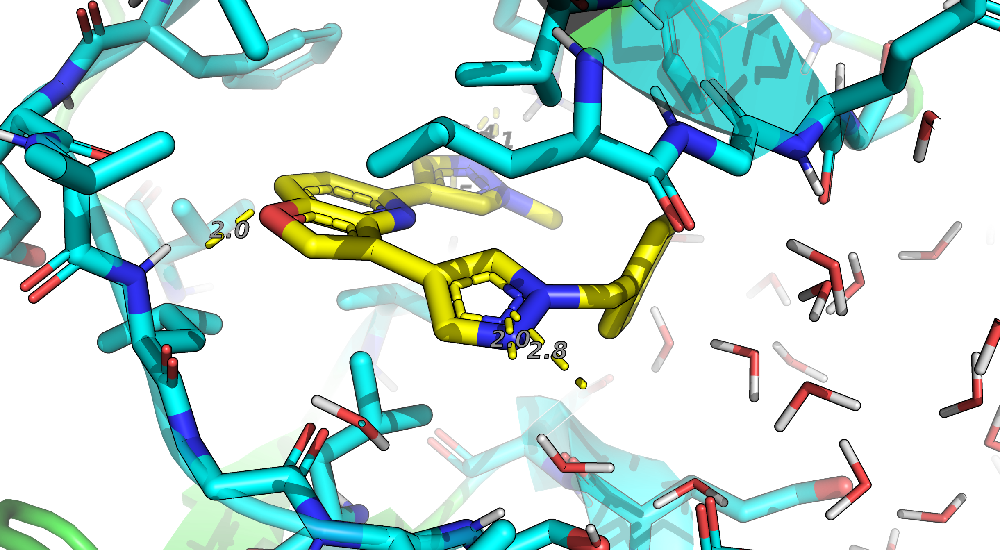